In [2]:
import torch
import torchvision
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import cv2

##1.load model

In [3]:
#each object are assigned different value of color
model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)
model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [4]:
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

##2.prediction

In [5]:
def get_prediction(img_path, threshold):
  #load image
  img = Image.open(img_path)
  #transform image
  transform = transforms.Compose([transforms.ToTensor()])
  img = transform(img)
  #inference
  pred = model([img])

  #make a list of score
  pred_score = list(pred[0]['scores'].detach().numpy())
  pred_t = [pred_score.index(x) for x in pred_score if x>threshold][-1]
  #make a list of mask
  masks = (pred[0]['masks']>0.5).squeeze().detach().cpu().numpy()
  #make a list of class
  pred_class = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(pred[0]['labels'].numpy())]
  #make a list of boxes
  pred_boxes = [[(i[0],i[1]),(i[2],i[3])] for i in list(pred[0]['boxes'].detach().numpy())]

  #select upto threshold value
  masks  = masks[:pred_t+1]
  pred_boxes = pred_boxes[:pred_t+1]
  pred_class = pred_class[:pred_t+1]

  return masks, pred_boxes, pred_class

##3.Random color mask

In [6]:
import numpy as np
def random_color_masks(image):
  colours = [[0, 255, 0],[0, 0, 255],[255, 0, 0],[0, 255, 255],[255, 255, 0],[255, 0, 255],[80, 70, 180],[250, 80, 190],[245, 145, 50],[70, 150, 250],[50, 190, 190]]
  r = np.zeros_like(image).astype(np.uint8)
  g = np.zeros_like(image).astype(np.uint8)
  b = np.zeros_like(image).astype(np.uint8)

  r[image == 1], g[image == 1], b[image == 1] = colours[np.random.randint(0,10)]

  coloured_mask = np.stack([r,g,b],axis=2)
  return coloured_mask

##4.Instance Segmentation

In [7]:
def instance_segmentation_api(img_path,threshold=0.5,rect_th =3,text_size=3,text_th=3):
  masks,boxes,pred_cls = get_prediction(img_path,threshold)

  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  for i in range(len(masks)):
    rgb_mask = random_color_masks(masks[i])
    img = cv2.addWeighted(img,1, rgb_mask,0.5,0)

    box = boxes[i]
    y1, x1 = int(box[0][1]), int(box[0][0])
    y2, x2 = int(box[1][1]), int(box[1][0])
    pt1 = (x1, y1)
    pt2 = (x2, y2)

    cv2.rectangle(img,pt1,pt2,color=(0,255,0),thickness=rect_th)
    cv2.putText(img,pred_cls[i],pt1,cv2.FONT_HERSHEY_SIMPLEX, text_size,(0,255,0),thickness=text_th)
  plt.figure(figsize=(20,30))
  plt.imshow(img)
  plt.xticks([])
  plt.yticks([])
  plt.show()


##5.Output

--2023-07-08 17:15:33--  https://www.wsha.org/wp-content/uploads/banner-diverse-group-of-people-2.jpg
Resolving www.wsha.org (www.wsha.org)... 141.193.213.10, 141.193.213.11
Connecting to www.wsha.org (www.wsha.org)|141.193.213.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1718649 (1.6M) [image/jpeg]
Saving to: ‘people.jpg’

people.jpg          100%[===================>]   1.64M  --.-KB/s    in 0.05s   

2023-07-08 17:15:34 (32.5 MB/s) - ‘people.jpg’ saved [1718649/1718649]



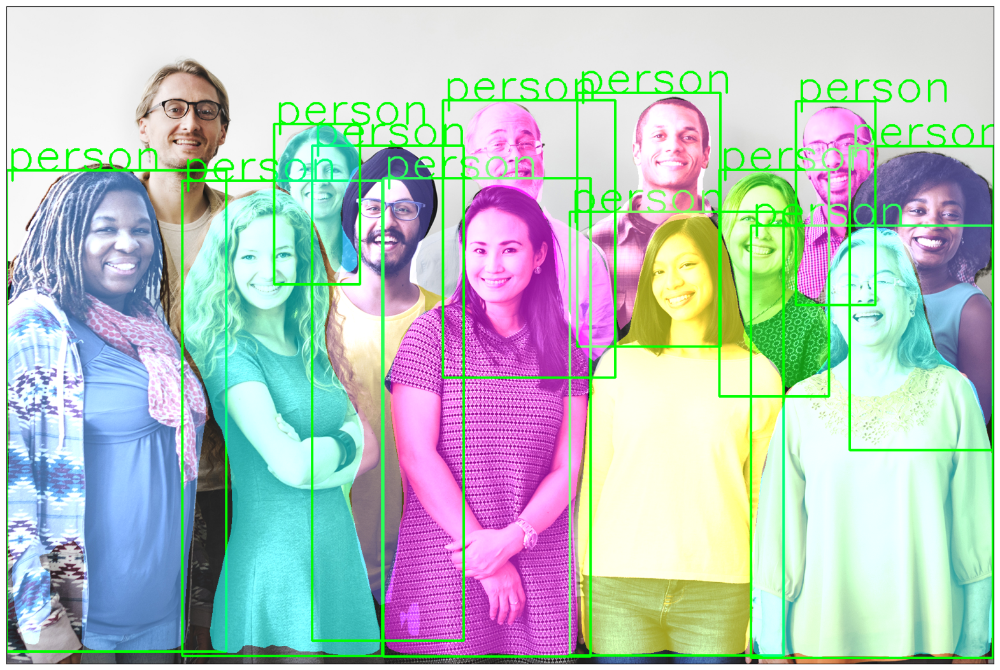

In [8]:
!wget https://www.wsha.org/wp-content/uploads/banner-diverse-group-of-people-2.jpg -O people.jpg
instance_segmentation_api('people.jpg',threshold=0.8)

--2023-07-08 17:15:52--  https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/10best-cars-group-cropped-1542126037.jpg
Resolving hips.hearstapps.com (hips.hearstapps.com)... 151.101.0.155, 151.101.64.155, 151.101.128.155, ...
Connecting to hips.hearstapps.com (hips.hearstapps.com)|151.101.0.155|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2178423 (2.1M) [image/jpeg]
Saving to: ‘car.jpg’

car.jpg             100%[===================>]   2.08M  --.-KB/s    in 0.04s   

2023-07-08 17:15:52 (49.2 MB/s) - ‘car.jpg’ saved [2178423/2178423]



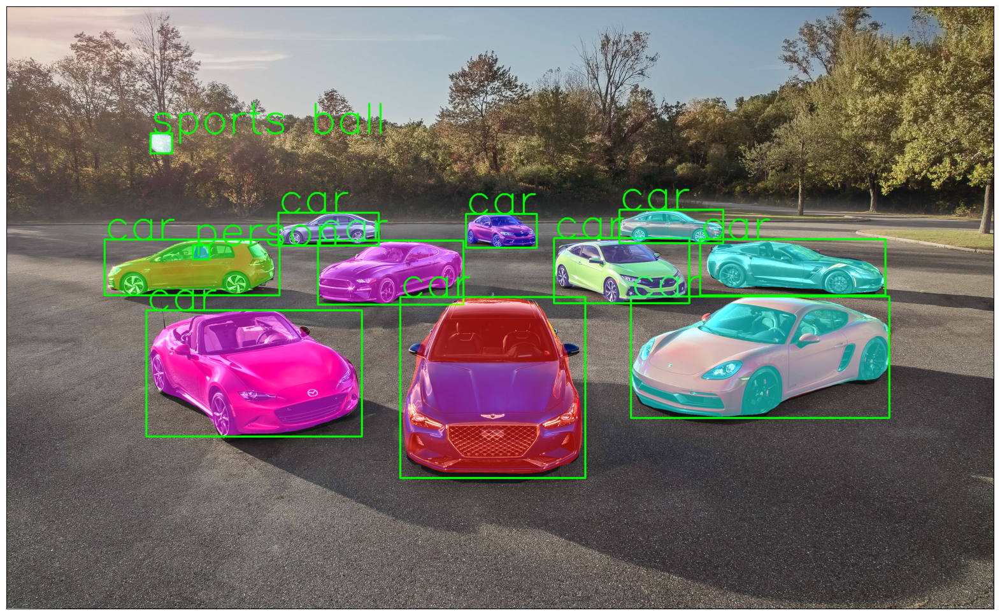

In [9]:
!wget https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/10best-cars-group-cropped-1542126037.jpg -O car.jpg
instance_segmentation_api('./car.jpg', rect_th=6, text_th=5, text_size=5)

--2023-07-08 17:16:06--  https://cdn.pixabay.com/photo/2013/07/05/01/08/traffic-143391_960_720.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 104.18.15.16, 104.18.14.16, 2606:4700::6812:e10, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|104.18.15.16|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 259865 (254K) [binary/octet-stream]
Saving to: ‘traffic.jpg’

traffic.jpg         100%[===================>] 253.77K  --.-KB/s    in 0.02s   

2023-07-08 17:16:07 (10.8 MB/s) - ‘traffic.jpg’ saved [259865/259865]



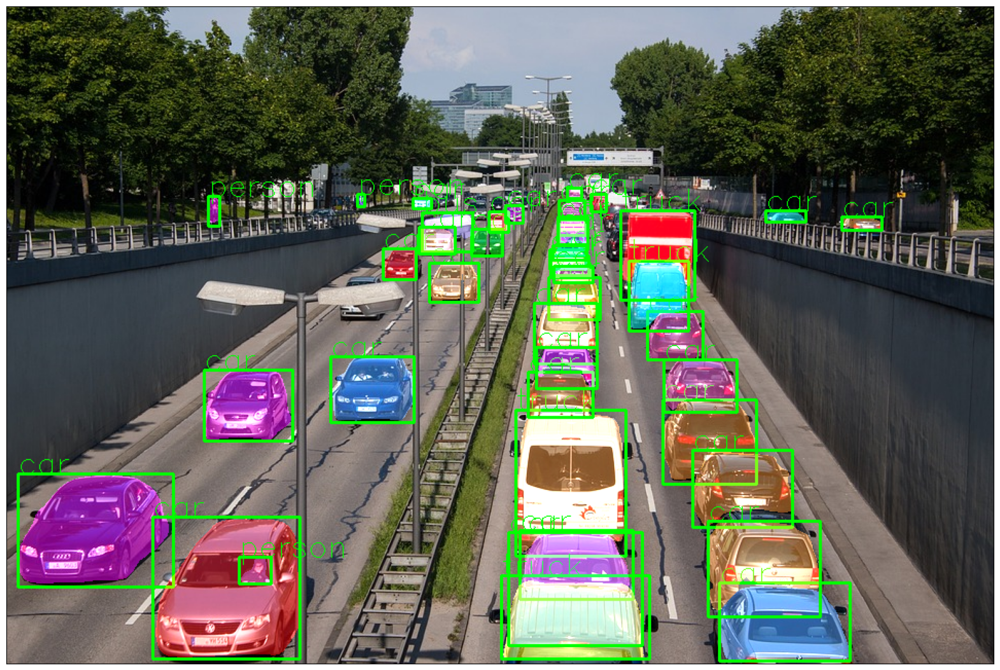

In [10]:
!wget https://cdn.pixabay.com/photo/2013/07/05/01/08/traffic-143391_960_720.jpg -O traffic.jpg

instance_segmentation_api('./traffic.jpg', rect_th=2, text_th=1, text_size=1)



```
Models	                       CPU	   GPU
Faster R-CNN ResNet-50 FPN	8.45859 s	0.15356 s
Mask R-CNN ResNet-50 FPN	  9.82342 s	0.21595 s
```

